In [1]:
from __future__ import print_function, division

import numpy as np
import h5py
import scipy.stats

import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator

from plot_utils import correlation_plot

In [2]:
mname = 'theta_dep_red_recalc'
plot_dir = f'/arc/home/aydanmckay/networkplots/idk'
plot_fmts = ('svg', 'png')

In [3]:
def load_predictions(fname, add_nonlin_A=False):
    """
    Loads neural network predictions:
        data       - Input data
        y_obs      - Observed (m_G-dm, m_X1-m_G, m_X2-m_G, ...)
        M_pred     - Predicted (M_G, M_X1-M_G, M_X2-M_G, ...)
        cov_y      - Covariance for each observation
        reddening  - Inferred reddening of each star
        R          - Inferred reddening vector for each star
    Returns a dictionary with each of the above elements.
    """
    d = {}

    # Load all fields stored in file
    with h5py.File(fname, 'r') as f:
        for key in f.keys():
            d[key] = f[key][:]
        d['R0'] = f.attrs['R0'][:]
    
    # Calculate reddened predictions
    A = d['r_fit'][:,None] * d['R_pred']
    d['M_plus_A_pred'] = d['M_pred'] + A

    # Calculate chi^2/d.o.f.
    dy = d['M_plus_A_pred'] - d['y_obs']

    icov = np.empty_like(d['cov_y'])
    for k,c in enumerate(d['cov_y']):
        icov[k] = np.linalg.inv(c)
    
    d['icov'] = icov

    #nu = dy.shape[1] # Number of parameters << number of observations
    #print(f'nu = {nu}')
    obs = np.empty(dy.shape, dtype='bool')
    for k in range(dy.shape[1]):
        obs[:,k] = (d['cov_y'][:,k,k] < 100.)
    d['nu'] = np.count_nonzero(obs, axis=1)
    print(d['nu'])
    print(np.median(d['nu']))
    print(np.mean(d['nu']))

    d['rchi2'] = np.einsum('ni,nij,nj->n', dy, icov, dy) / d['nu']
    d['obs'] = obs

    return d

In [4]:
def rchi2_hist(pred, prefix=''):
    fig = plt.figure(figsize=(8,6), dpi=150)
    ax = fig.add_subplot(1,1,1)

    bins = np.arange(0., 5.01, 0.1)
    ax.hist(pred['rchi2'], bins=bins, density=True)

    ylim = ax.get_ylim()

    r = np.linspace(0., bins[-1], 1000)
    nu = pred['y_obs'].shape[1]

    for nu_k in range(1,nu+1):
        pdf = scipy.stats.chi2(nu_k).pdf(r*nu_k)*nu_k#/(bins[1]-bins[0])
        ax.plot(r, pdf, c='b', alpha=0.25)

    ax.set_xlim(0., bins[-1])
    ax.set_ylim(ylim)
    ax.xaxis.set_minor_locator(AutoMinorLocator())

    for fmt in plot_fmts:
        fig.savefig(f'{plot_dir}/{prefix}rchi2_hist.{fmt}', dpi=150)
    plt.close(fig)

In [5]:
def rchi2_trends(pred, prefix=''):
    y = pred['rchi2']
    y_bins = np.arange(0., 15.01, 0.25)

    x_fields = [
        ('teff', pred['data']['atm_param'][:,0], r'$T_{\mathrm{eff}}$', (3500.,8500.)),
        ('logg', pred['data']['atm_param'][:,1], r'$\log \left( g \right)$', (0.6,5.4)),
        ('feh', pred['data']['atm_param'][:,2], r'$\left[ \mathrm{Fe} / \mathrm{H} \right]$', (-2.5,0.5)),
        ('reddening', pred['r_fit'], r'$\mathrm{reddening}$', (0.,1.25))
    ]

    for key,x,label,lim in x_fields:
        fig = plt.figure(figsize=(8,6), dpi=150)
        ax = fig.add_subplot(1,1,1)
        
        idx = np.isfinite(x) & np.isfinite(y) & (x > lim[0]) & (x < lim[1])
        correlation_plot(ax, x[idx], y[idx], y_bins=y_bins)#, norm='max')
        
        ax.set_xlabel(label)
        ax.set_ylabel(r'$\chi^2 / \nu$')
        
        for fmt in plot_fmts:
            fig.savefig(f'{plot_dir}/{prefix}rchi2_trend_{key}.{fmt}')
        plt.close(fig)

In [6]:
def rchi2_hrd(pred, prefix=''):
    #c = pred['rchi2']
    x = pred['data']['atm_param'][:,0] # T_eff
    yy = (
        (pred['M_pred'][:,0], r'$M_G$', (-3.,11.)), # M_G
        (pred['data']['atm_param'][:,1], r'$\log \left(g\right)$', (-1.0,6.0)), # log(g)
    )
    
    #im = ax.scatter(
    #    x, y, c=c,
    #    vmin=0., vmax=5.,
    #    edgecolors='none',
    #    alpha=0.1,
    #    rasterized=True
    #)
    
    idx_all = np.ones(x.size, dtype='bool')
    spec = [
        ('rchi2', pred['rchi2'], idx_all, r'$\chi^2 / \nu$', (0., 5.), 'viridis'),
        ('dE', pred['r_fit']-pred['data']['r'], idx_all, r'$\mathrm{d}E$', (-0.2, 0.2), 'coolwarm'),
        ('E', pred['r_fit'], idx_all, r'$E$', (0.0, 0.5), 'viridis')
    ]
    
    bands = ['BP', 'RP', 'g', 'r', 'i', 'z', 'y', 'J', 'H', 'K_s', 'W_1', 'W_2']
    for i,b in enumerate(bands):
        idx = (pred['cov_y'][:,i+1,i+1] < 99.)
        dy = pred['y_obs'][idx,i+1] - pred['M_plus_A_pred'][idx,i+1]
        spec.append((
            f'd{b.replace("_","")}G',
            dy,
            idx,
            rf'$\Delta \left( {b} - G \right)$',
            (-0.2, 0.2),
            'coolwarm'
        ))
        dy = dy / np.sqrt(pred['cov_y'][idx,i+1,i+1])
        spec.append((
            f'chi{b.replace("_","")}G',
            dy,
            idx,
            rf'$\Delta \left( {b} - G \right)/\sigma$',
            (-5., 5.),
            'coolwarm'
        ))
    
    for i,(b0,b1) in enumerate(zip(bands[:-1],bands[1:])):
        c = (
              pred['cov_y'][:,i+2,i+2]
            + pred['cov_y'][:,i+1,i+1]
            - 2. * pred['cov_y'][:,i+2,i+1]
        )
        idx = (
              (pred['cov_y'][:,i+1,i+1] < 100.)
            & (pred['cov_y'][:,i+2,i+2] < 100.)
        )
        y0 = (pred['M_plus_A_pred'][:,i+1] - pred['M_plus_A_pred'][:,i+2])
        y1 = (pred['y_obs'][:,i+1] - pred['y_obs'][:,i+2])
        dy = (y1-y0) / np.sqrt(c)
        spec.append((
            f'chi{b0.replace("_","")}{b1.replace("_","")}',
            dy,
            idx,
            rf'$\Delta \left( {b0} - {b1} \right) / \sigma$',
            (-2., 2.),
            'coolwarm'
        ))
    
    for (y,ylabel,ylim),plot_type in zip(yy, ('HRD', 'Kiel')):
        for name,c,idx,clabel,(vmin,vmax),cmap in spec:
            fig,ax = plt.subplots(1,1, figsize=(8,8), dpi=150)
            
            im = ax.hexbin(
                x[idx], y[idx], C=c,
                extent=(3000.,9000.)+ylim,
                gridsize=100,
                mincnt=5,
                reduce_C_function=np.median,
                vmin=vmin, vmax=vmax,
                linewidth=0.3,
                cmap=cmap
            )
            
            ax.set_xlim(ax.get_xlim()[::-1])
            ax.set_ylim(ax.get_ylim()[::-1])
            
            cb = fig.colorbar(im, ax=ax)
            cb.set_alpha(1.)
            cb.draw_all()
            cb.set_label(clabel)

            ax.set_xlabel(r'$T_{\mathrm{eff}}$')
            ax.set_ylabel(ylabel)
            
            for fmt in plot_fmts:
                fname = f'{plot_dir}/{prefix}{name}_{plot_type}.{fmt}'
                print(f'Saving {fname} ...')
                fig.savefig(fname)
            plt.close(fig)

In [7]:
def residual_trends(pred, comp_with_G=False, prefix=''):
    # Calculate residuals in (G, G-BP, BP-RP, RP-g, g-r, ...)-space,
    # or in (G, BP-G, RP-G, g-G, r-G, ...)-space, depending on whether
    # comp_with_G is False or True.
    dy = pred['y_obs'] - pred['M_plus_A_pred']
    if not comp_with_G:
        dy[:,1:] = dy[:,:-1] - dy[:,1:]

    obs = np.empty(dy.shape, dtype='bool')
    obs[:,0] = (pred['cov_y'][:,0,0] < 100.)
    dy_over_err = np.empty_like(dy)
    dy_over_err[:,0] = dy[:,0] / np.sqrt(pred['cov_y'][:,0,0])
    for k in range(1,dy.shape[1]):
        if comp_with_G:
            dy_over_err[:,k] = dy[:,k] / np.sqrt(pred['cov_y'][:,k,k])
            obs[:,k] = (pred['cov_y'][:,k,k] < 100.)
        else:
            c = (
                  pred['cov_y'][:,k,k]
                + pred['cov_y'][:,k-1,k-1]
                - 2. * pred['cov_y'][:,k,k-1]
            )
            #c -= 2. * 0.02**2
            obs[:,k] = (
                  (pred['cov_y'][:,k,k] < 100.)
                & (pred['cov_y'][:,k-1,k-1] < 100.)
            )
            dy_over_err[:,k] = dy[:,k] / np.sqrt(c)

    x_fields = [
        ('teff', pred['data']['atm_param'][:,0], r'$T_{\mathrm{eff}}$', (3500.,8500.)),
        ('logg', pred['data']['atm_param'][:,1], r'$\log \left( g \right)$', (0.6,5.4)),
        ('feh', pred['data']['atm_param'][:,2], r'$\left[ \mathrm{Fe} / \mathrm{H} \right]$', (-2.5,0.5)),
        ('reddening', pred['r_fit'], r'$\mathrm{reddening}$', (0.,1.25)),
        ('G', pred['data']['mag'][:,0], r'$m_G$', (10.,19.))
    ]

    y_bins = np.arange(-5., 5.01, 0.2)

    bands = ['G', 'BP', 'RP'] + list('grizyJH') + ['K_s','W_1','W_2']
    if comp_with_G:
        y_cols = (
              [bands[0]]
            + [f'{b}-G' for b in bands[1:]]
        )
    else:
        y_cols = (
              [bands[0]]
            + [f'{b1}-{b2}' for b1,b2 in zip(bands[:-1],bands[1:])]
        )

    for k,col_label in enumerate(y_cols):
        col_label_simple = col_label.replace('-','').replace('_','')
        if k != 0:
            col_label = r'\left( {} \right)'.format(col_label)

        y = dy_over_err[:,k]

        for key,x,xlabel,lim in x_fields:
            fig = plt.figure(figsize=(8,6), dpi=150)
            ax = fig.add_subplot(1,1,1)
            
            idx = (
                  np.isfinite(x) & np.isfinite(y) & obs[:,k]
                & (x > lim[0]) & (x < lim[1])
            )
            if ~np.any(idx):
                continue
            correlation_plot(ax, x[idx], y[idx], y_bins=y_bins)
            
            ax.set_xlabel(xlabel)

            ylabel = ' - '.join([
                r'{}_{{ \mathrm{{ {} }} }}'.format(col_label,sub)
                for sub in ('obs', 'pred')
            ])
            ylabel = r'$\left[ {} \right] / \sigma$'.format(ylabel)
            ax.set_ylabel(ylabel)
            
            for fmt in plot_fmts:
                fig.savefig(f'{plot_dir}/{prefix}d{col_label_simple}_trend_{key}.{fmt}')
            plt.close(fig)

In [8]:
def select_subset(pred, idx):
    p = {}
    for key in pred:
        if key == 'R0':
            p[key] = pred[key]
        else:
            p[key] = pred[key][idx]
    return p

[13 13 12 ... 13 13 13]
13.0
12.068888256632762
28118 sources from all & all.
chi^2/nu = 0.4391772323184543
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmall_rchi2_HRD.svg ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmall_rchi2_HRD.png ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmall_dE_HRD.svg ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmall_dE_HRD.png ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmall_E_HRD.svg ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmall_E_HRD.png ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmall_dBPG_HRD.svg ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmall_dBPG_HRD.png ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmall_chiBPG_HRD.svg ...
Saving /arc/home/aydanmckay/networkplots/id

/arc/home/aydanmckay/.local/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/arc/home/aydanmckay/.local/lib/python3.9/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmapogee_dE_HRD.svg ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmapogee_dE_HRD.png ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmapogee_E_HRD.svg ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmapogee_E_HRD.png ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmapogee_dBPG_HRD.svg ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmapogee_dBPG_HRD.png ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmapogee_chiBPG_HRD.svg ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmapogee_chiBPG_HRD.png ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmapogee_dRPG_HRD.svg ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmapogee_dRPG_HRD.png ...
Saving /arc/home/aydanmcka

/tmp/ipykernel_4118/634043749.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(8,6), dpi=150)


0 sources from all & galah.
chi^2/nu = nan
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmgalah_rchi2_HRD.svg ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmgalah_rchi2_HRD.png ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmgalah_dE_HRD.svg ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmgalah_dE_HRD.png ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmgalah_E_HRD.svg ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmgalah_E_HRD.png ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmgalah_dBPG_HRD.svg ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmgalah_dBPG_HRD.png ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmgalah_chiBPG_HRD.svg ...
Saving /arc/home/aydanmckay/networkplots/idk/theta_dep_red_recalc_rall_atmgalah_chiBPG_HRD

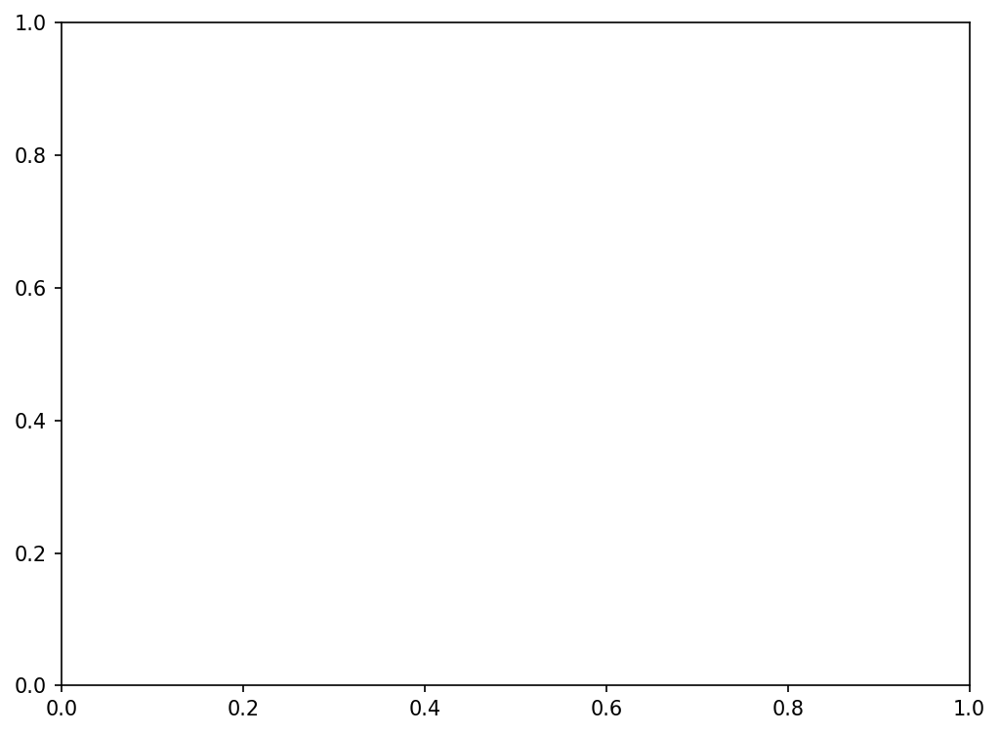

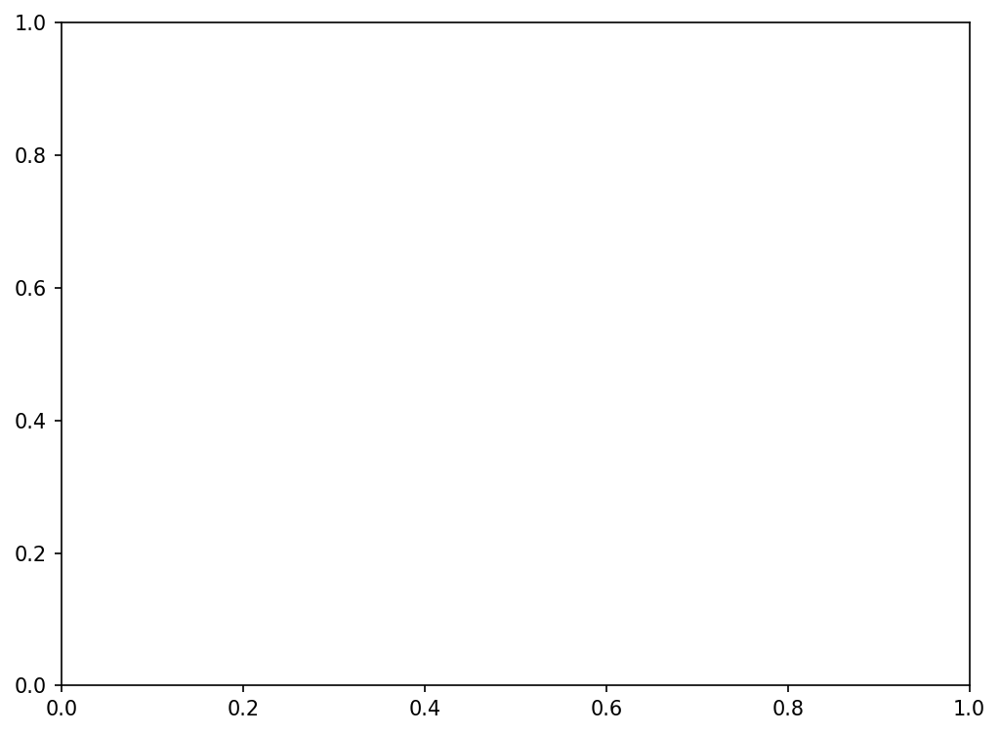

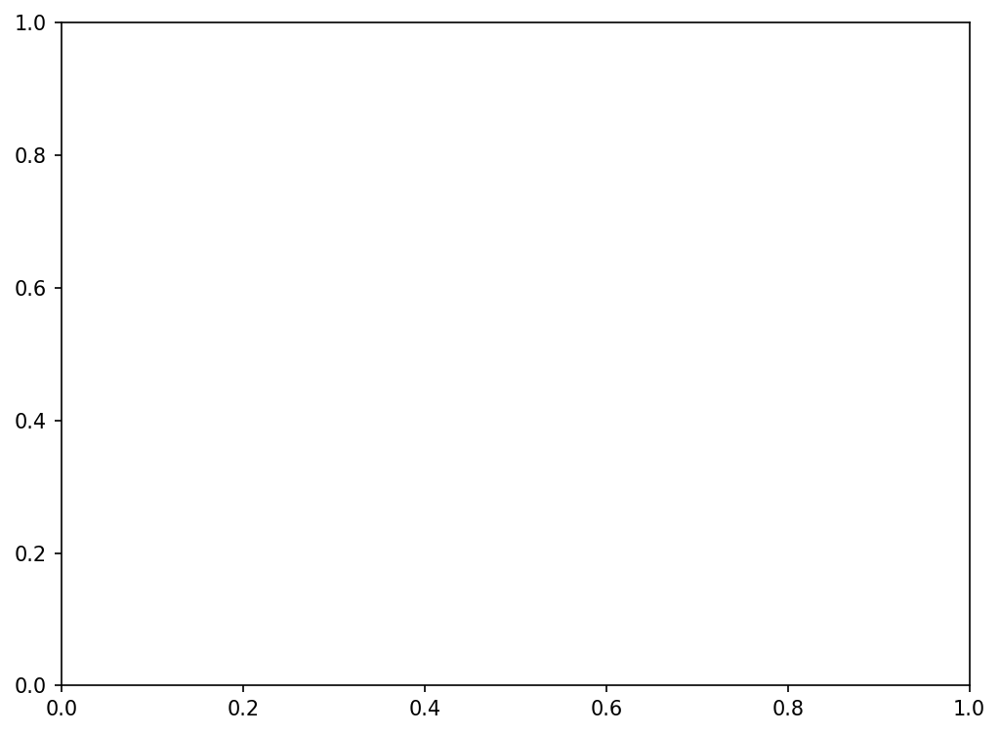

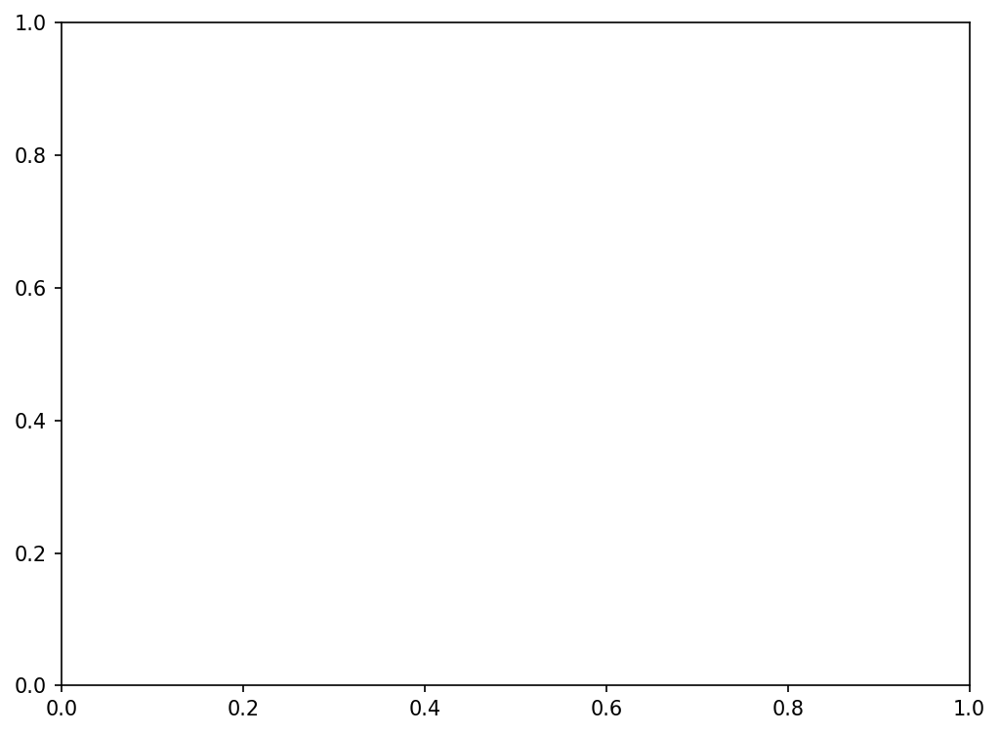

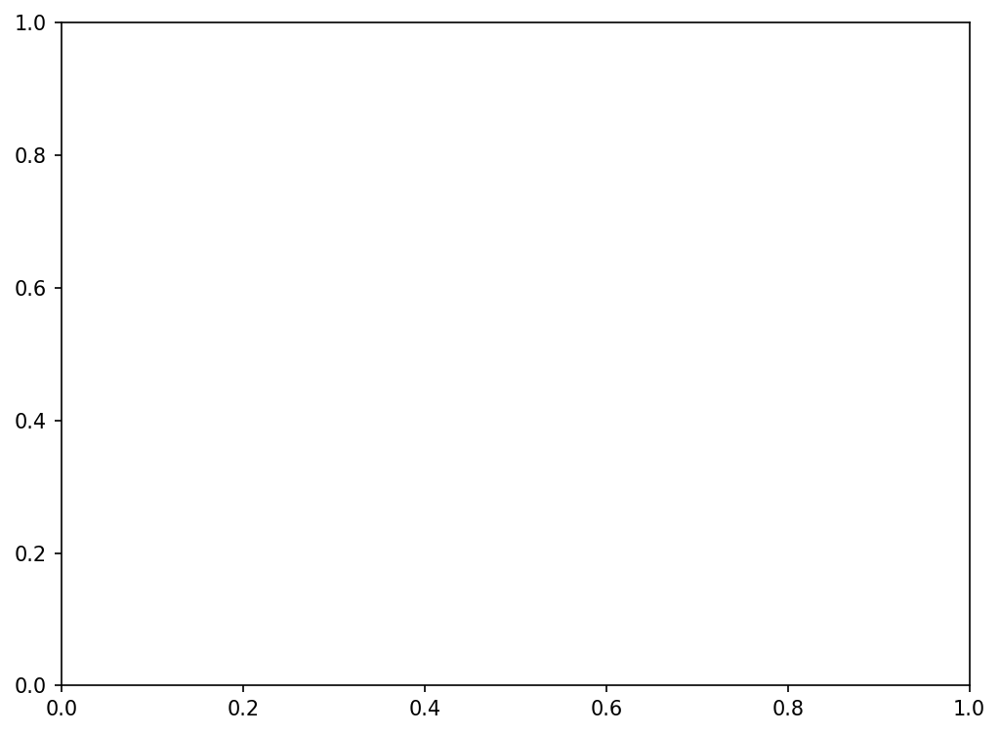

...

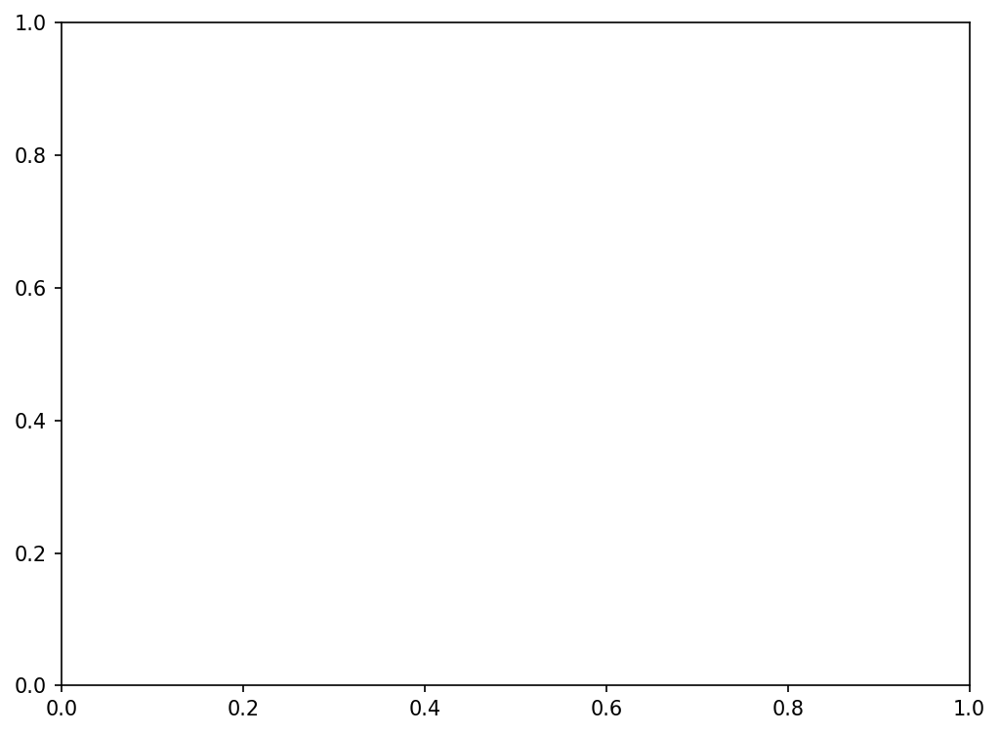

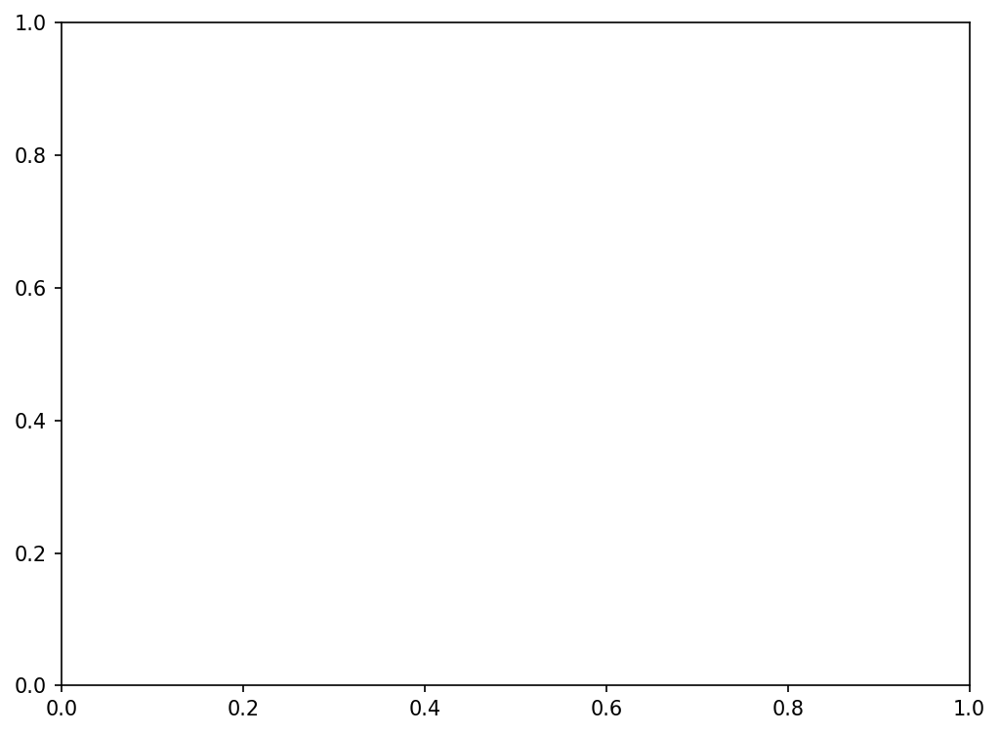

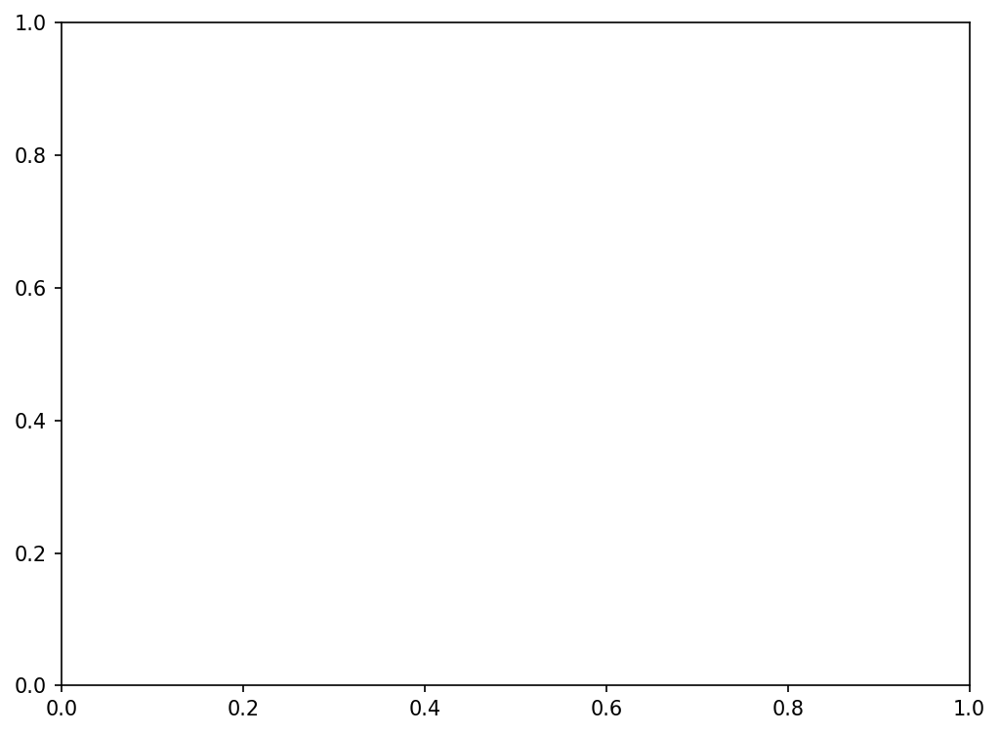

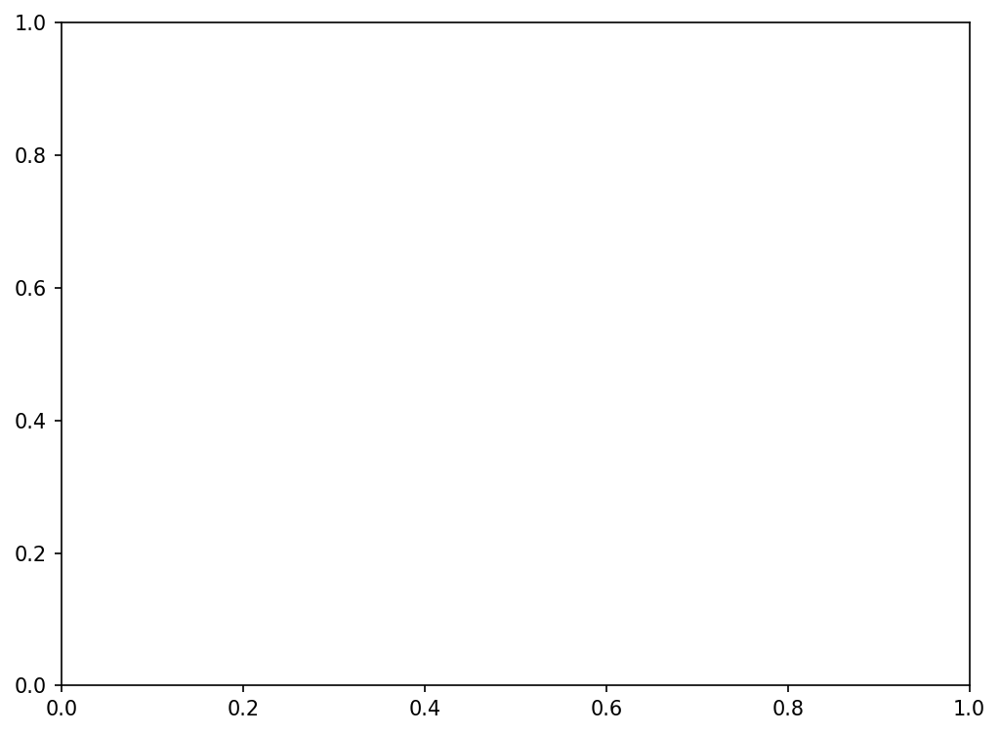

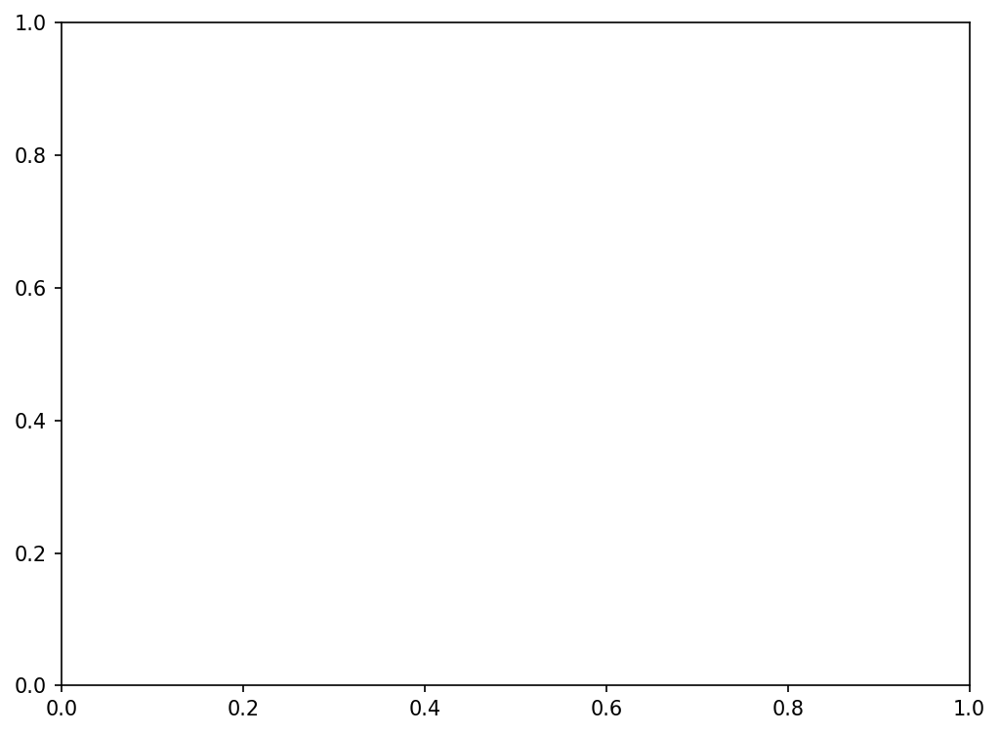

In [9]:
# fname = 'predictions_{mname}_2hidden_it14.h5'
fname = '/arc/home/aydanmckay/ml/network/predictions/predictions_ext_0h_l1n2_2hidden_it19.h5'

pred = load_predictions(fname, add_nonlin_A=False)

for r_source in [b'all', b'sfd', b'b19', b'default']:
    if r_source == b'all':
        idx_r = np.ones(pred['data'].size, dtype='bool')
    else:
        idx_r = (pred['data']['r_source'] == r_source)

    # for atm_source in [b'all', b'lamost', b'apogee', b'galah']:
    for atm_source in [b'all', b'lamost']:
        if atm_source == b'all':
            idx_atm = np.ones(pred['data'].size, dtype='bool')
        else:
            idx_atm = (pred['data']['atm_source'] == atm_source)

        idx = idx_r & idx_atm
        n = np.count_nonzero(idx)
        print(f'{n} sources from {r_source.decode()} & {atm_source.decode()}.')
        p = select_subset(pred, idx)

        print('chi^2/nu = {}'.format(np.median(p['rchi2'])))

        prefix = f'{mname}_r{r_source.decode()}_atm{atm_source.decode()}_'

        rchi2_hrd(p, prefix=prefix)
        #rchi2_hist(pred, prefix=prefix)
        #rchi2_trends(pred, prefix=prefix)
        residual_trends(p, comp_with_G=True, prefix=prefix)
        residual_trends(p, comp_with_G=False, prefix=prefix)